In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [3]:
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

In [2]:
pd.set_option('display.max_columns', None)
df = pd.read_csv("../dev/fraudTrain.csv", index_col=0)
df.head()

,trans_date_trans_time,cc_num,merchant,category,amt,first,last,gender,street,city,state,zip,lat,long,city_pop,job,dob,trans_num,unix_time,merch_lat,merch_long,is_fraud
0,2019-01-01 00:00:18,2703186189652095,"fraud_Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,NC,28654,36.0788,-81.1781,3495,"Psychologist, counselling",1988-03-09,0b242abb623afc578575680df30655b9,1325376018,36.011293,-82.048315,0
1,2019-01-01 00:00:44,630423337322,"fraud_Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,WA,99160,48.8878,-118.2105,149,Special educational needs teacher,1978-06-21,1f76529f8574734946361c461b024d99,1325376044,49.159047,-118.186462,0
2,2019-01-01 00:00:51,38859492057661,fraud_Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,ID,83252,42.1808,-112.2620,4154,Nature conservation officer,1962-01-19,a1a22d70485983eac12b5b88dad1cf95,1325376051,43.150704,-112.154481,0
3,2019-01-01 00:01:16,3534093764340240,"fraud_Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,MT,59632,46.2306,-112.1138,1939,Patent attorney,1967-01-12,6b849c168bdad6f867558c3793159a81,1325376076,47.034331,-112.561071,0
4,2019-01-01 00:03:06,375534208663984,fraud_Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,VA,24433,38.4207,-79.4629,99,Dance movement psychotherapist,1986-03-28,a41d7549acf90789359a9aa5346dcb46,1325376186,38.674999,-78.632459,0


In [23]:
df.dtypes

trans_date_trans_time     object
cc_num                     int64
merchant                  object
category                  object
amt                      float64
first                     object
last                      object
gender                    object
street                    object
city                      object
state                     object
zip                        int64
lat                      float64
long                     float64
city_pop                   int64
job                       object
dob                       object
trans_num                 object
unix_time                  int64
merch_lat                float64
merch_long               float64
is_fraud                   int64
dtype: object

In [24]:
df.describe()

,cc_num,amt,zip,lat,long,city_pop,unix_time,merch_lat,merch_long,is_fraud
count,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06,1.296675e+06
mean,4.171920e+17,7.035104e+01,4.880067e+04,3.853762e+01,-9.022634e+01,8.882444e+04,1.349244e+09,3.853734e+01,-9.022646e+01,5.788652e-03
std,1.308806e+18,1.603160e+02,2.689322e+04,5.075808e+00,1.375908e+01,3.019564e+05,1.284128e+07,5.109788e+00,1.377109e+01,7.586269e-02
min,6.041621e+10,1.000000e+00,1.257000e+03,2.002710e+01,-1.656723e+02,2.300000e+01,1.325376e+09,1.902779e+01,-1.666712e+02,0.000000e+00
25%,1.800429e+14,9.650000e+00,2.623700e+04,3.462050e+01,-9.679800e+01,7.430000e+02,1.338751e+09,3.473357e+01,-9.689728e+01,0.000000e+00
50%,3.521417e+15,4.752000e+01,4.817400e+04,3.935430e+01,-8.747690e+01,2.456000e+03,1.349250e+09,3.936568e+01,-8.743839e+01,0.000000e+00
75%,4.642255e+15,8.314000e+01,7.204200e+04,4.194040e+01,-8.015800e+01,2.032800e+04,1.359385e+09,4.195716e+01,-8.023680e+01,0.000000e+00
max,4.992346e+18,2.894890e+04,9.978300e+04,6.669330e+01,-6.795030e+01,2.906700e+06,1.371817e+09,6.751027e+01,-6.695090e+01,1.000000e+00


In [25]:
df.isnull().sum()

trans_date_trans_time    0
cc_num                   0
merchant                 0
category                 0
amt                      0
first                    0
last                     0
gender                   0
street                   0
city                     0
state                    0
zip                      0
lat                      0
long                     0
city_pop                 0
job                      0
dob                      0
trans_num                0
unix_time                0
merch_lat                0
merch_long               0
is_fraud                 0
dtype: int64

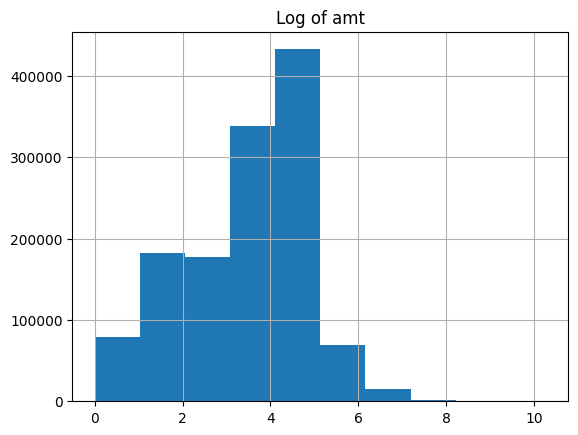

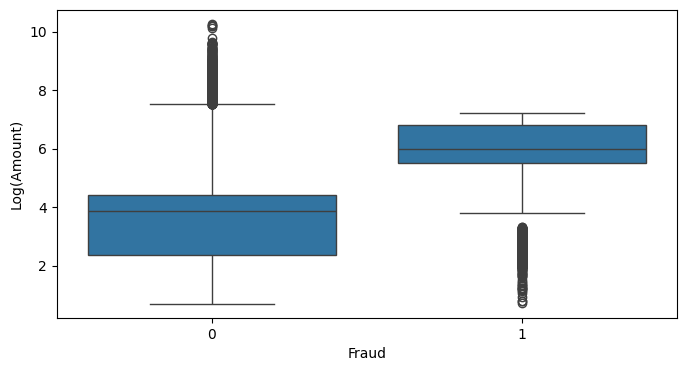

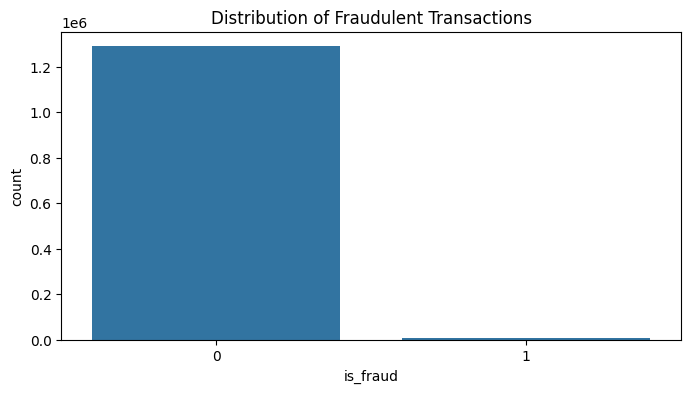

is_fraud
0    1289169
1       7506
Name: count, dtype: int64

In [26]:
np.log(df.amt).hist()
plt.title('Log of amt')
plt.show()
 
log_amt = df[['amt', 'is_fraud']].copy()
log_amt['log_amt'] = np.log(log_amt['amt'] + 1)

plt.figure(figsize=(8, 4))
sns.boxplot(x='is_fraud', y='log_amt', data=log_amt)
plt.xlabel('Fraud')
plt.ylabel('Log(Amount)')
plt.show()

plt.figure(figsize=(8, 4))
sns.countplot(x='is_fraud', data=log_amt)
plt.title('Distribution of Fraudulent Transactions')
plt.show()

log_amt['is_fraud'].value_counts()

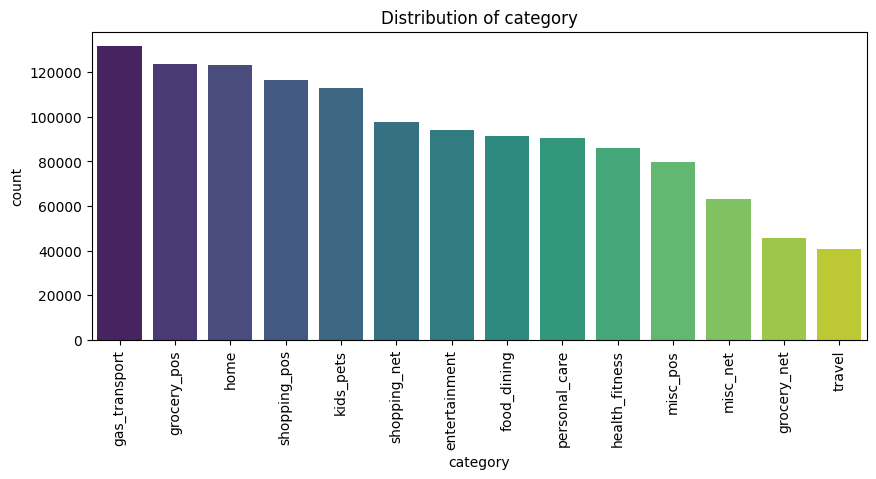

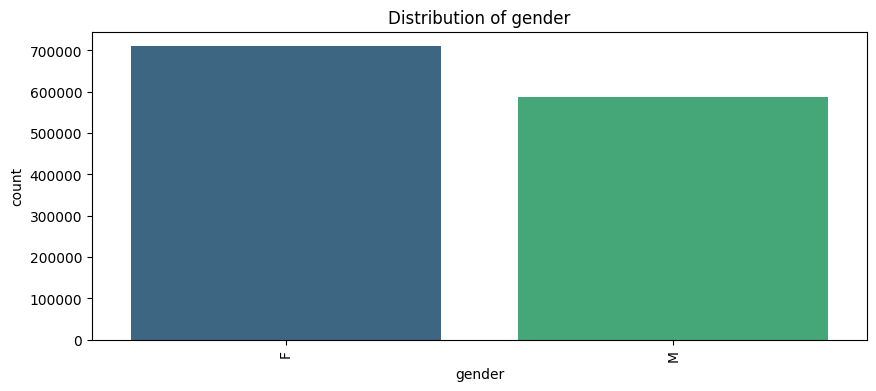

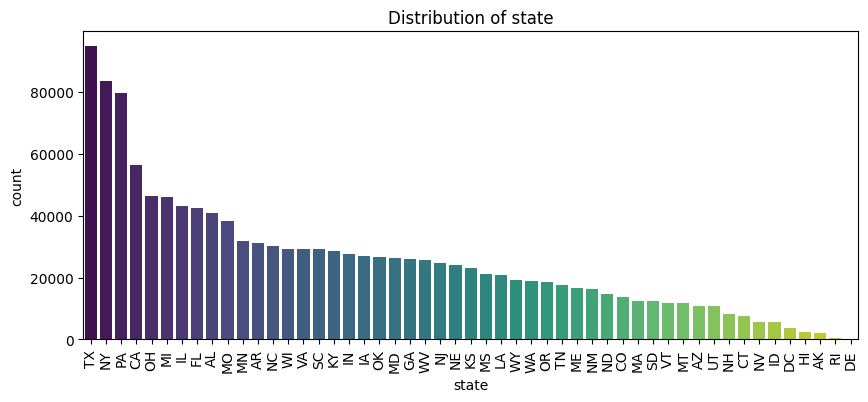

In [4]:
categorical_cols = ['category', 'gender', 'state']

for col in categorical_cols:
    plt.figure(figsize=(10, 4))
    sns.countplot(x=col, data=df, order=df[col].value_counts().index, palette = 'viridis')
    plt.title(f'Distribution of {col}')
    plt.xticks(rotation=90)
    plt.show()


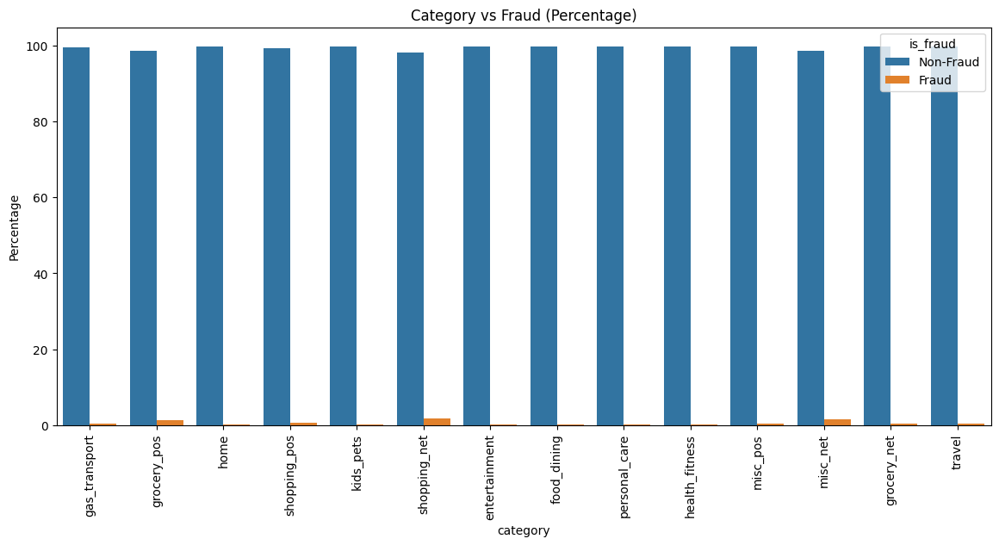

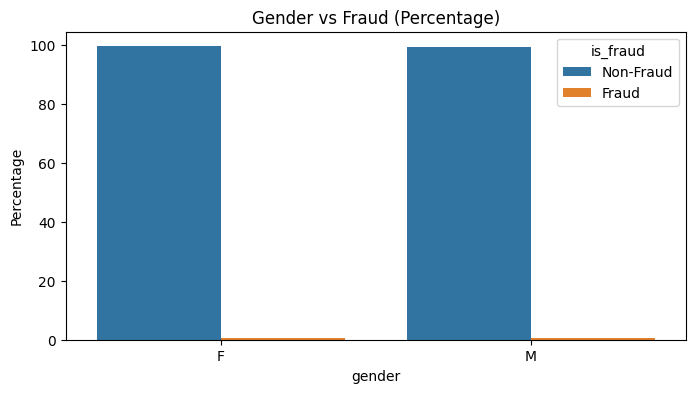

In [11]:
category_counts = df.groupby(['category', 'is_fraud']).size().unstack(fill_value=0)
category_percentages = category_counts.div(category_counts.sum(axis=1), axis=0) * 100
category_percentages = category_percentages.reset_index()
category_percentages_melted = category_percentages.melt(id_vars='category', value_vars=[0, 1], var_name='is_fraud', value_name='percentage')
category_percentages_melted['is_fraud'] = category_percentages_melted['is_fraud'].map({0: 'Non-Fraud', 1: 'Fraud'})

plt.figure(figsize=(14, 6))
sns.barplot(x='category', y='percentage', hue='is_fraud', data=category_percentages_melted, order=df['category'].value_counts().index)
plt.title('Category vs Fraud (Percentage)')
plt.xticks(rotation=90)
plt.ylabel('Percentage')
plt.show()

gender_counts = df.groupby(['gender', 'is_fraud']).size().unstack(fill_value=0)
gender_percentages = gender_counts.div(gender_counts.sum(axis=1), axis=0) * 100
gender_percentages = gender_percentages.reset_index()
gender_percentages_melted = gender_percentages.melt(id_vars='gender', value_vars=[0, 1], var_name='is_fraud', value_name='percentage')
gender_percentages_melted['is_fraud'] = gender_percentages_melted['is_fraud'].map({0: 'Non-Fraud', 1: 'Fraud'})

plt.figure(figsize=(8, 4))
sns.barplot(x='gender', y='percentage', hue='is_fraud', data=gender_percentages_melted)
plt.title('Gender vs Fraud (Percentage)')
plt.ylabel('Percentage')
plt.show()

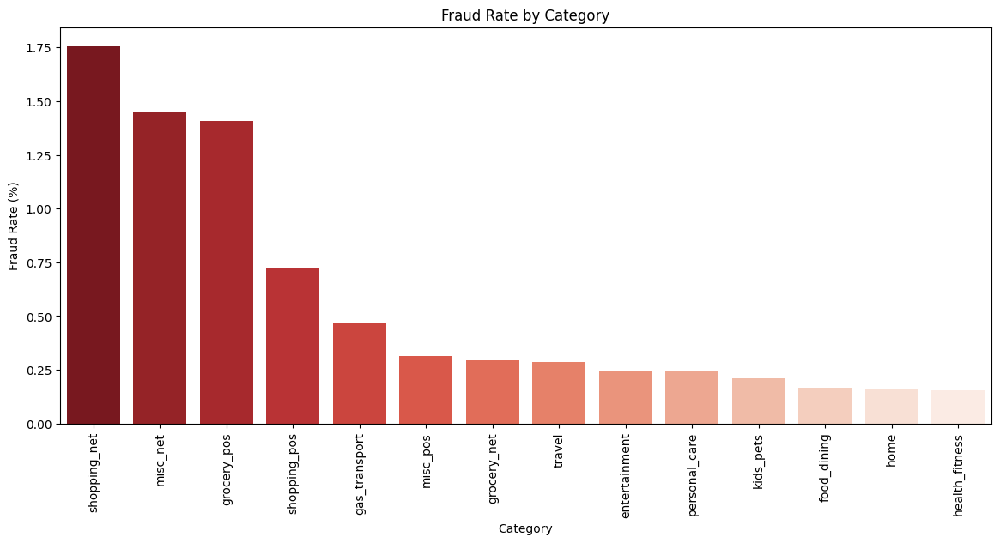

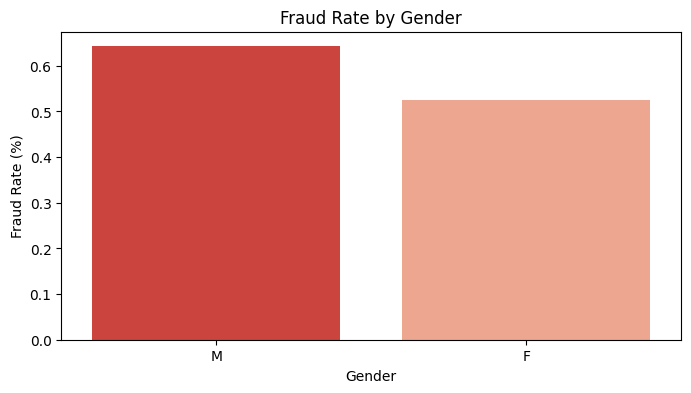

In [5]:
# 카테고리 별 Fraud 비율 계산
category_fraud_rate = df[df['is_fraud'] == 1].groupby('category').size() / df.groupby('category').size() * 100
category_fraud_rate = category_fraud_rate.reset_index().rename(columns={0: 'fraud_rate'})

plt.figure(figsize=(14, 6))
sns.barplot(x='category', y='fraud_rate', data=category_fraud_rate, palette='Reds_r', order=category_fraud_rate.sort_values('fraud_rate', ascending=False)['category'])
plt.title('Fraud Rate by Category')
plt.xticks(rotation=90)
plt.ylabel('Fraud Rate (%)')
plt.xlabel('Category')
plt.show()

# 성별 별 Fraud 비율 계산
gender_fraud_rate = df[df['is_fraud'] == 1].groupby('gender').size() / df.groupby('gender').size() * 100
gender_fraud_rate = gender_fraud_rate.reset_index().rename(columns={0: 'fraud_rate'})

plt.figure(figsize=(8, 4))
sns.barplot(x='gender', y='fraud_rate', data=gender_fraud_rate, palette='Reds_r', order=gender_fraud_rate.sort_values('fraud_rate', ascending=False)['gender'])
plt.title('Fraud Rate by Gender')
plt.ylabel('Fraud Rate (%)')
plt.xlabel('Gender')
plt.show()

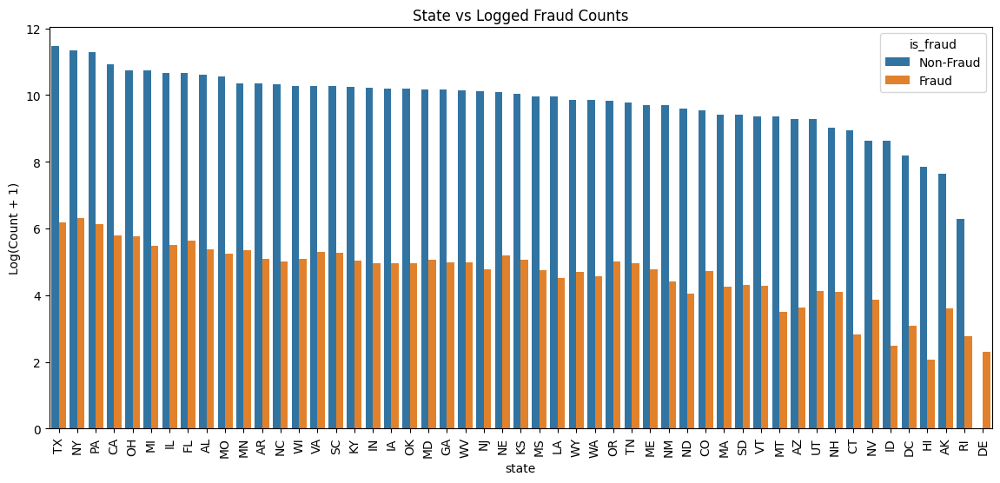

In [12]:
state_fraud_counts = df.groupby(['state', 'is_fraud']).size().unstack(fill_value=0)
state_fraud_counts_log = np.log1p(state_fraud_counts)
state_fraud_counts_log = state_fraud_counts_log.reset_index()
state_fraud_counts_log_melted = state_fraud_counts_log.melt(id_vars='state', value_vars=[0, 1], var_name='is_fraud', value_name='log_count')
state_fraud_counts_log_melted['is_fraud'] = state_fraud_counts_log_melted['is_fraud'].map({0: 'Non-Fraud', 1: 'Fraud'})

plt.figure(figsize=(14, 6))
sns.barplot(x='state', y='log_count', hue='is_fraud', data=state_fraud_counts_log_melted, order=df['state'].value_counts().index)
plt.title('State vs Logged Fraud Counts')
plt.xticks(rotation=90)
plt.ylabel('Log(Count + 1)')
plt.show()

In [16]:
df['merchant'] = df['merchant'].str.replace('fraud_', '')
df.head()

,cc_num,merchant,category,amt,first,last,gender,street,city,state,transaction_dt
0,2703186189652095,"Rippin, Kub and Mann",misc_net,4.97,Jennifer,Banks,F,561 Perry Cove,Moravian Falls,NC,2019-01-01 00:00:18
1,630423337322,"Heller, Gutmann and Zieme",grocery_pos,107.23,Stephanie,Gill,F,43039 Riley Greens Suite 393,Orient,WA,2019-01-01 00:00:44
2,38859492057661,Lind-Buckridge,entertainment,220.11,Edward,Sanchez,M,594 White Dale Suite 530,Malad City,ID,2019-01-01 00:00:51
3,3534093764340240,"Kutch, Hermiston and Farrell",gas_transport,45.00,Jeremy,White,M,9443 Cynthia Court Apt. 038,Boulder,MT,2019-01-01 00:01:16
4,375534208663984,Keeling-Crist,misc_pos,41.96,Tyler,Garcia,M,408 Bradley Rest,Doe Hill,VA,2019-01-01 00:03:06


In [17]:
df.category.value_counts()

category
gas_transport     131659
grocery_pos       123638
home              123115
shopping_pos      116672
kids_pets         113035
shopping_net       97543
entertainment      94014
food_dining        91461
personal_care      90758
health_fitness     85879
misc_pos           79655
misc_net           63287
grocery_net        45452
travel             40507
Name: count, dtype: int64

In [8]:
# !pip install folium
import folium
from folium.plugins import MarkerCluster

### job 종류 확인

In [10]:
count = df['job'].value_counts().reset_index()
count.columns = ['job', 'n']
count.T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174,175,176,177,178,179,180,181,182,183,184,185,186,187,188,189,190,191,192,193,194,195,196,197,198,199,200,201,202,203,204,205,206,207,208,209,210,211,212,213,214,215,216,217,218,219,220,221,222,223,224,225,226,227,228,229,230,231,232,233,234,235,236,237,238,239,240,241,242,243,244,245,246,247,248,249,250,251,252,253,254,255,256,257,258,259,260,261,262,263,264,265,266,267,268,269,270,271,272,273,274,275,276,277,278,279,280,281,282,283,284,285,286,287,288,289,290,291,292,293,294,295,296,297,298,299,300,301,302,303,304,305,306,307,308,309,310,311,312,313,314,315,316,317,318,319,320,321,322,323,324,325,326,327,328,329,330,331,332,333,334,335,336,337,338,339,340,341,342,343,344,345,346,347,348,349,350,351,352,353,354,355,356,357,358,359,360,361,362,363,364,365,366,367,368,369,370,371,372,373,374,375,376,377,378,379,380,381,382,383,384,385,386,387,388,389,390,391,392,393,394,395,396,397,398,399,400,401,402,403,404,405,406,407,408,409,410,411,412,413,414,415,416,417,418,419,420,421,422,423,424,425,426,427,428,429,430,431,432,433,434,435,436,437,438,439,440,441,442,443,444,445,446,447,448,449,450,451,452,453,454,455,456,457,458,459,460,461,462,463,464,465,466,467,468,469,470,471,472,473,474,475,476,477,478,479,480,481,482,483,484,485,486,487,488,489,490,491,492,493
job,Film/video editor,Exhibition designer,Naval architect,"Surveyor, land/geomatics",Materials engineer,"Designer, ceramics/pottery",Systems developer,IT trainer,Financial adviser,Environmental consultant,Chartered public finance accountant,"Scientist, audiological",Chief Executive Officer,"Copywriter, advertising",Comptroller,Sub,Podiatrist,Agricultural consultant,Paramedic,Magazine features editor,Historic buildings inspector/conservation officer,"Librarian, public",Building surveyor,Musician,Water engineer,"Scientist, research (maths)",Mining engineer,Barrister,Audiological scientist,Immunologist,Clothing/textile technologist,Prison officer,Financial trader,Claims inspector/assessor,Energy engineer,Petroleum engineer,Quantity surveyor,Make,"Engineer, automotive",Mechanical engineer,Geoscientist,Counsellor,Secondary school teacher,Land/geomatics surveyor,Firefighter,Early years teacher,"Sales professional, IT",Pensions consultant,"Psychologist, forensic","Psychotherapist, child","Librarian, academic",Research scientist (physical sciences),Electrical engineer,Insurance underwriter,Science writer,Medical sales representative,Chartered loss adjuster,Drilling engineer,"Engineer, biomedical",Trade mark attorney,Television production assistant,Special educational needs teacher,"Scientist, marine",Cytogeneticist,Chemical engineer,Multimedia programmer,Accounting technician,Dealer,Counselling psychologist,Technical brewer,Trading standards officer,Toxicologist,"Engineer, production",Social researcher,Radio producer,Chief Strategy Officer,Physiotherapist,Fine artist,"Teacher, special educational needs",Race relations officer,"Engineer, control and instrumentation",Radio broadcast assistant,"Therapist, occupational","Surveyor, minerals",Educational psychologist,Ceramics designer,Advertising account planner,Town planner,"Programme researcher, broadcasting/film/video","Exhibitions officer, museum/gallery",Surgeon,Futures trader,Television/film/video producer,Further education lecturer,"Scientist, biomedical","Designer, industrial/product",English as a second language teacher,Applications developer,Probatio

### state열 확인

In [11]:
df['state'].unique()

array(['NC', 'WA', 'ID', 'MT', 'VA', 'PA', 'KS', 'TN', 'IA', 'WV', 'FL',
       'CA', 'NM', 'NJ', 'OK', 'IN', 'MA', 'TX', 'WI', 'MI', 'WY', 'HI',
       'NE', 'OR', 'LA', 'DC', 'KY', 'NY', 'MS', 'UT', 'AL', 'AR', 'MD',
       'GA', 'ME', 'AZ', 'MN', 'OH', 'CO', 'VT', 'MO', 'SC', 'NV', 'IL',
       'NH', 'SD', 'AK', 'ND', 'CT', 'RI', 'DE'], dtype=object)

### city_pop에 따른 state별 빈도

In [13]:
state_city_pop = df.groupby(['state', 'city_pop']).size().reset_index(name='n').sort_values(by='n', ascending=False)
state_city_pop.T

,824,51,825,136,242,210,638,135,823,109,359,360,23,923,720,674,335,48,727,423,862,616,457,327,41,705,907,536,101,105,864,403,647,5,255,39,509,306,435,337,43,788,291,483,21,459,567,349,171,428,402,826,802,32,807,71,865,256,348,122,74,525,197,361,28,265,228,679,730,848,84,520,873,911,300,90,808,813,812,768,739,880,446,119,560,302,513,585,766,245,377,871,111,455,891,80,510,26,272,316,800,914,592,161,925,527,796,646,358,257,811,786,448,518,22,746,711,698,913,354,841,612,227,289,685,25,207,863,386,458,623,284,134,579,309,728,188,869,202,10,718,221,817,547,487,878,218,78,293,837,828,677,424,7,418,598,436,323,558,472,840,192,680,370,333,756,451,514,169,304,673,835,543,461,201,792,676,887,278,384,671,710,892,194,366,299,723,719,254,591,8,921,508,672,904,553,774,858,773,280,396,468,88,324,15,769,440,545,62,356,364,778,535,656,481,915,230,860,413,724,438,191,394,501,782,59,467,185,642,872,279,92,326,668,401,463,63,417,502,552,246,235,770,341,593,684,31,264,634,475,137,89,380,444,180,696,635,106,793,497,879,908,749,789,294,926,182,776,747,833,148,11,268,303,30,410,56,919,53,20,924,528,595,70,173,599,282,633,734,717,421,565,400,664,900,138,750,505,0,390,683,87,313,40,60,702,174,903,742,18,803,247,209,58,412,877,729,665,321,741,603,353,277,118,658,534,68,771,151,482,681,184,236,445,129,33,799,712,657,615,35,549,114,625,896,620,784,150,533,500,57,411,627,103,336,522,883,315,894,602,479,391,253,801,73,551,600,426,753,181,344,628,6,905,562,345,261,77,212,76,519,906,798,460,687,471,546,641,387,855,852,373,530,608,809,432,156,159,675,740,819,81,3,204,737,305,572,613,288,901,203,554,917,176,162,61,331,239,124,651,491,775,797,596,220,152,578,379,815,167,644,707,274,160,287,343,690,215,266,385,154,640,397,566,503,267,456,263,126,763,495,689,389,827,38,439,474,433,843,716,783,449,95,541,839,205,175,897,140,548,601,830,577,686,465,851,576,258,462,621,260,587,45,590,164,884,916,226,429,918,46,275,575,443,697,857,795,760,100,506,496,362,868,610,661,748,722,149,93,649,116,832,452,845,650,476,234,765,96,271,383,867,37,375,310,317,752,751,416,145,352,895,542,281,121,480,490,678,332,454,251,539,49,557,805,189,17,153,196,334,108,555,163,104,292,66,755,368,648,645,414,655,225,347,568,14,820,55,339,113,125,155,86,713,290,131,405,244,478,144,693,692,604,139,130,488,790,127,521,371,511,744,213,298,65,666,694,670,779,531,211,381,861,427,909,529,853,199,9,434,241,785,570,286,312,594,708,473,64,663,629,237,322,27,158,219,24,499,512,550,233,29,847,283,691,703,270,758,120,308,859,844,378,736,117,700,818,388,517,688,607,704,624,626,447,829,178,494,338,466,899,764,922,179,639,363,794,252,132,699,721,854,470,2,822,165,157,804,762,329,314,810,571,195,611,190,745,493,489,636,223,301,16,415,477,912,910,419,342,72,269,492,643,399,19,112,372,357,920,259,821,208,318,193,524,393,866,168,885,660,667,107,408,532,143,619,842,376,367,94,91,4,365,653,224,732,733,484,44,325,297,754,328,886,296,504,586,453,523,609,652,123,564,725,882,743,631,486,836,340,498,166,889,395,229,369,709,99,295,250,537,177,52,834,146,831,311,133,507,319,198,102,420,222,320,659,888,630,398,632,701,85,735,597,791,838,355,141,573,97,392,902,780,618,485,406,54,34,83,13,606,787,816,187,422,850,98,669,622,544,374,351,243,726,231,777,881,186,214,273,172,556,12,515,654,407,559,75,772,115,874,637,588,582,248,206,200,431,42,574,183,464,437,142,147,617,890,516,262,170,781,605,538,47,540,682,469,580,870,216,307,814,614,846,238,662,1,757,285,759,450,589,581,738,563,36,276,128,893,382,875,876,583,67,761,561,731,430,82,249,849,714,706,330,350,50,110,584,715,806,898,346,526,441,442,240,409,404,69,569,217,79,425,695,767,232,856
state,TX,AZ,TX,FL,IN,IL,OK,FL,TX,DC,MI,MI,AL,WY,PA,PA,MI,AZ,SC,MS,VT,OH,NC,ME,AR,PA,WV,NY,CO,CT,WA,MO,OK,AL,KS,AR,NJ,MD,MT,MI,AR,TX,LA,NE,AL,ND,NY,MI,IA,MS,MO,UT,TX,AR,TX,CA,WA,KS,MI,FL,CA,NV,IL,MN,AR,KY,IN,PA,SC,VA,CA,NM,WA,WV,MA,CA,TX,TX,TX,TN,SC,WI,NC,FL,NY,MD,NM,NY,TN,KS,MN,WA,FL,NC,WI,CA,NJ,AL,KY,MD,TX,WV,NY,GA,WY,NY,TX,OK,MI,KS,TX,TX,NC,NM,AL,SD,PA,PA,WV,MI,VA,OH,IN,LA,PA,AL,IL,VT,MO,NC,OH,LA

### is_fraud 데이터 필터링

In [14]:
fraud = df[df['is_fraud'] == 1][['state', 'merch_lat', 'merch_long', 'is_fraud']]

### 위경도 시각화

In [41]:
import folium

# 미국 중심 좌표
m = folium.Map(location=[37.0902, -95.7129], zoom_start=4)

# MarkerCluster를 사용하여 시각화
marker_cluster = MarkerCluster().add_to(m)

for idx, row in fraud.iterrows():
    folium.Marker([row['merch_lat'], row['merch_long']], popup=row['state']).add_to(marker_cluster)

m

지도 보일 수 없을 경우

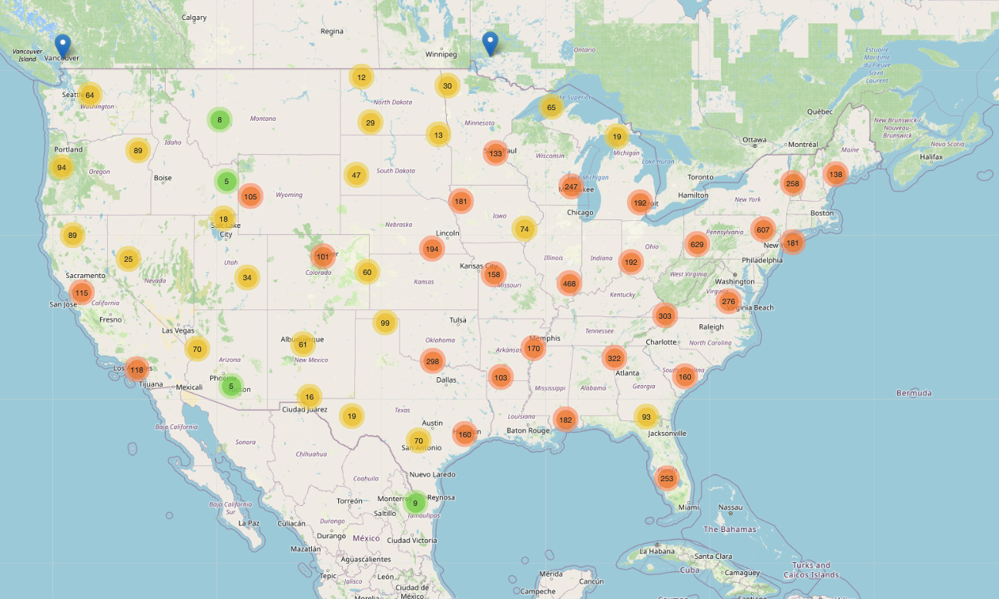

### 주별 사기 건수

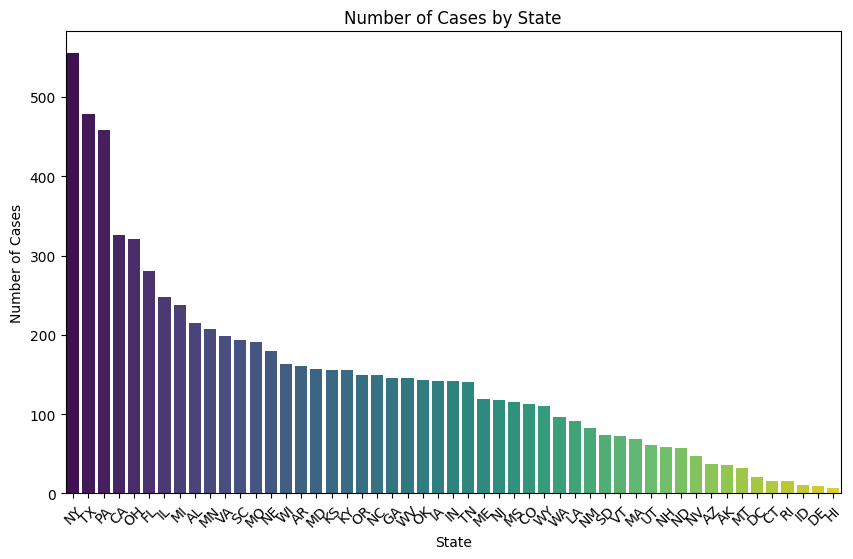

In [15]:
fraud_count = fraud['state'].value_counts().reset_index()
fraud_count.columns = ['state', 'n']

# 막대 그래프 그리기
plt.figure(figsize=(10, 6))
sns.barplot(x='state', y='n', data=fraud_count, palette='viridis')
plt.xticks(rotation=45)
plt.title("Number of Cases by State")
plt.xlabel("State")
plt.ylabel("Number of Cases")
plt.show()

### dob별 사기 건수

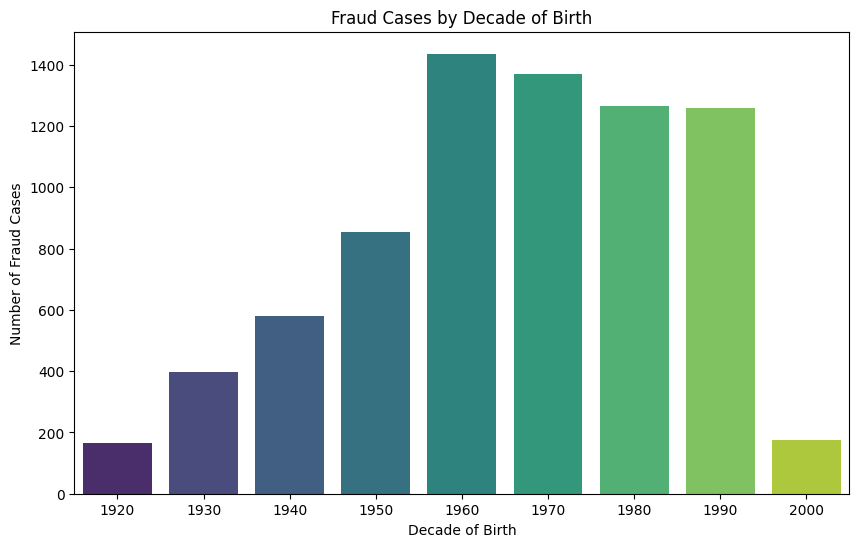

In [16]:
df['dob'] = pd.to_datetime(df['dob'], errors='coerce')
df['year'] = df['dob'].dt.year
df['decade'] = (df['year'] // 10) * 10

fraud_by_decade = df[df['is_fraud'] == 1].groupby('decade').size().reset_index(name='fraud_count')

# 결과 시각화
plt.figure(figsize=(10, 6))
sns.barplot(x='decade', y='fraud_count', data=fraud_by_decade, palette='viridis')
plt.title("Fraud Cases by Decade of Birth")
plt.xlabel("Decade of Birth")
plt.ylabel("Number of Fraud Cases")
plt.show()

### 주별 인구수와 사기 비율

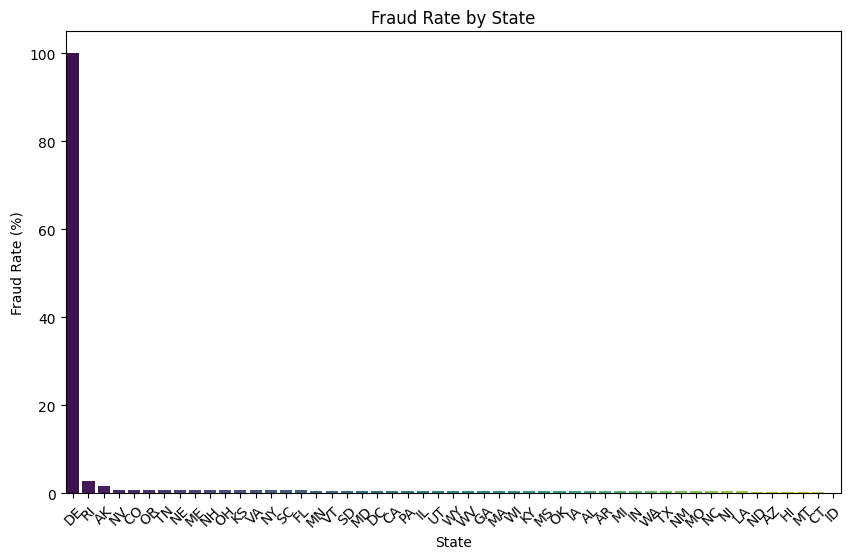

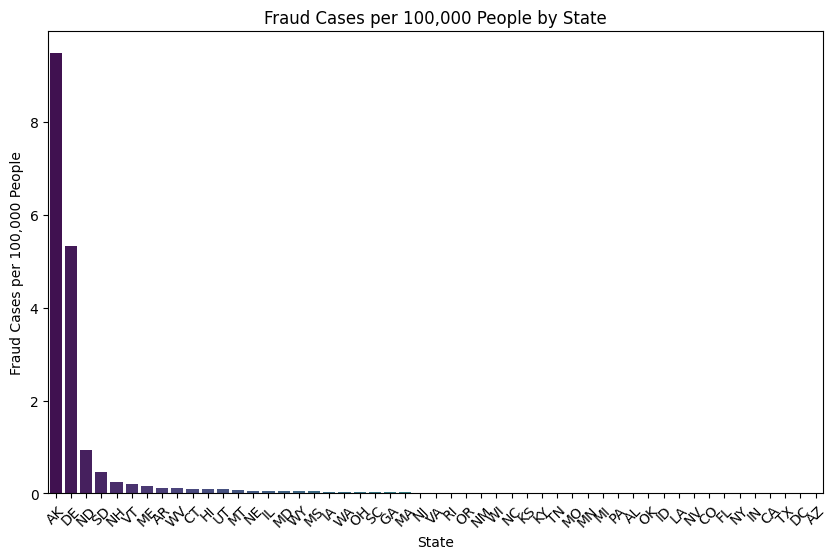

In [17]:
state_population = df.groupby('state')['city_pop'].sum().reset_index(name='total_population')

state_fraud = df.groupby('state').agg(fraud_count=('is_fraud', 'sum'), total_transactions=('is_fraud', 'count')).reset_index()
state_fraud = state_fraud.merge(state_population, on='state')
state_fraud['fraud_rate'] = (state_fraud['fraud_count'] / state_fraud['total_transactions']) * 100
state_fraud['fraud_per_capita'] = (state_fraud['fraud_count'] / state_fraud['total_population']) * 100000

# 사기율 시각화
plt.figure(figsize=(10, 6))
sns.barplot(x='state', y='fraud_rate', data=state_fraud.sort_values(by='fraud_rate', ascending=False), palette='viridis')
plt.xticks(rotation=45)
plt.title("Fraud Rate by State")
plt.xlabel("State")
plt.ylabel("Fraud Rate (%)")
plt.show()

# 인구당 사기 건수 시각화
plt.figure(figsize=(10, 6))
sns.barplot(x='state', y='fraud_per_capita', data=state_fraud.sort_values(by='fraud_per_capita', ascending=False), palette='viridis')
plt.xticks(rotation=45)
plt.title("Fraud Cases per 100,000 People by State")
plt.xlabel("State")
plt.ylabel("Fraud Cases per 100,000 People")
plt.show()

### Unix_time을 사용한 시간대별 사기 건수

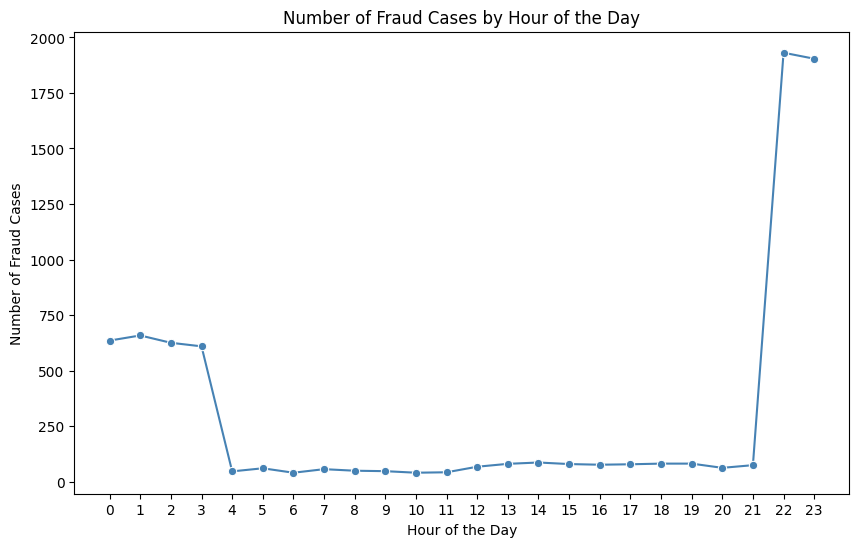

In [45]:
df['datetime'] = pd.to_datetime(df['unix_time'], unit='s')
df['hour'] = df['datetime'].dt.hour

fraud_by_hour = df[df['is_fraud'] == 1].groupby('hour').size().reset_index(name='fraud_count')

# 결과 시각화
plt.figure(figsize=(10, 6))
sns.lineplot(x='hour', y='fraud_count', data=fraud_by_hour, marker='o', color='steelblue')
plt.title("Number of Fraud Cases by Hour of the Day")
plt.xlabel("Hour of the Day")
plt.ylabel("Number of Fraud Cases")
plt.xticks(range(24))
plt.show()